 # AUTOMATIC CHORD-SCALE DETECTION & STUDENT PERFORMANCE ASSESMENT FOR JAZZ IMPROVISATION 
 
 ## PART 3 : ANALYSIS ON MUSICCRITIC: SCALE EXERCISE 

In [1]:
import sys,os
sys.path.append(os.path.join(os.path.dirname('__file__'), 'freesound-python/'))

from IPython.display import Audio
from IPython.core.display import display, HTML, Image

from utilities import *
import ExerciseAssessment as ex

#Directory for audio files
audioDir = 'audio/'
#Directory for audio segment annotations

annotationsDir = 'scale_annotations/'
#Directory for Feature Data (.csv and pickle files)
dataDir = 'data/'

#ANALYSIS PARAMETERS FOR FEATURE EXTRACTION

params=AnalysisParams(200,100,'hann',2048,44100,12)

#MUSICCRITIC ANALYSIS PARAMETERS

AUDIODIR = 'ScaleExercise_audio/'
if os.path.exists(AUDIODIR) != 1:
    os.mkdir(AUDIODIR)
FILEDIR = 'chord-scale_exercise/'

exercise = 'exercise.json'
IMAGEPATH = 'img/'
if os.path.exists(IMAGEPATH) != 1:
    os.mkdir(IMAGEPATH)

studentPerformances = []
for file in os.listdir(AUDIODIR):
    if not file.endswith('mix.mp3') :
        studentPerformances.append(file)
print(studentPerformances)        

['868.wav', '861.wav', 'CSVfilefor_12bins.csv', '865.wav', '857.wav', '863.wav', '860.wav', '869.wav', '570.mp3', '872.wav', '858.wav', '859.wav', '862.wav', '866.wav', '571.mp3', '870.wav', '864.wav', '867.wav', '871.wav']


In [2]:
### FIRST, LET'S DEFINE A DICTIONARY THAT CONTAINS ALL THE PREDEFINED SCALE TEMPLATES

ScaleTemplates = dict()
    
ScaleTemplates['major'] = {'scaleArray':[1,0,1,0,1,1,0,1,0,1,0,1]}
ScaleTemplates['dorian'] = {'scaleArray':[1,0,1,1,0,1,0,1,0,1,1,0]}
ScaleTemplates['phrygian'] = {'scaleArray':[1,1,0,1,0,1,0,1,1,0,1,0]}
ScaleTemplates['lydian'] = {'scaleArray':[1,0,1,0,1,0,1,1,0,1,0,1]}
ScaleTemplates['mixolydian'] = {'scaleArray':[1,0,1,0,1,1,0,1,0,1,1,0]}
ScaleTemplates['minor'] = {'scaleArray':[1,0,1,1,0,1,0,1,1,0,1,0]}
ScaleTemplates['locrian'] = {'scaleArray':[1,1,0,1,0,1,1,0,1,0,1,0]}
ScaleTemplates['lydianb7'] = {'scaleArray':[1,0,1,0,1,0,1,1,0,1,1,0]}
ScaleTemplates['altered'] = {'scaleArray':[1,1,0,1,1,0,1,0,1,0,1,0]}
ScaleTemplates['mminor'] = {'scaleArray':[1,0,1,1,0,1,0,1,0,1,0,1]}
ScaleTemplates['hminor'] = {'scaleArray':[1,0,1,1,0,1,0,1,1,0,0,1]}
ScaleTemplates['hwdiminished'] = {'scaleArray':[1,1,0,1,1,0,1,1,0,1,1,0]}
ScaleTemplates['wholetone'] = {'scaleArray':[1,0,1,0,1,0,1,0,1,0,1,0]}
ScaleTemplates['chromatic'] = {'scaleArray':[1,1,1,1,1,1,1,1,1,1,1,1]}

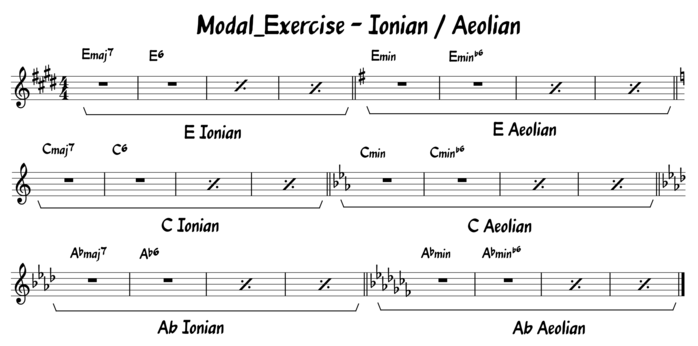

In [3]:
Image(filename = IMAGEPATH + "scalesexercise.png", width=700, height=700)

In [4]:
FILENAME = os.path.join(AUDIODIR, '871.wav')
EXERCISEFILE = os.path.join(FILEDIR,exercise)
Audio(FILENAME, rate = params.fs)

#### FEATURE EXTRACTION 

#### ANALYSIS ON SEPERATED REGIONS OF THE EXERCISE

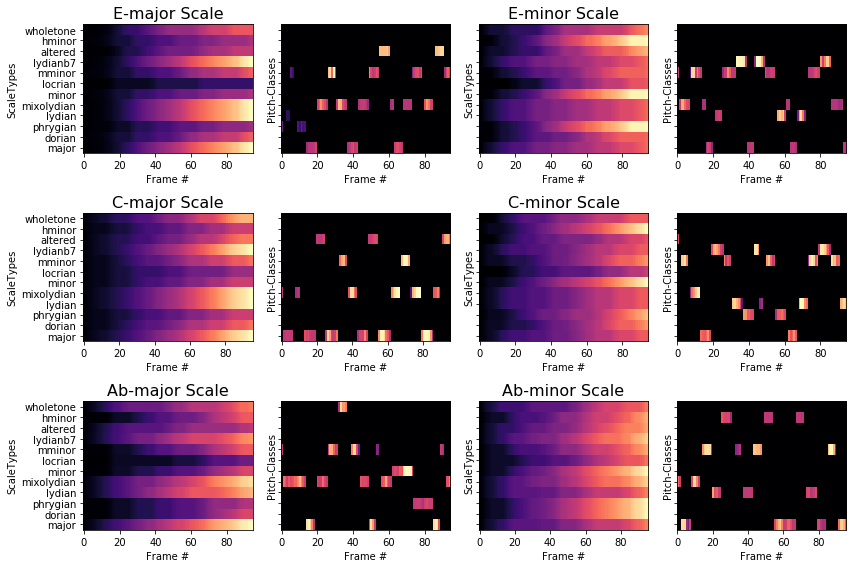

[['PARTS', ('In-Scale_Rate', 'Scale_Correctness', 'In-Scale_Completeness')], ['Part1', (0.99374560690109925, 'N/A', 0.7142857142857143)], ['Part2', (0.83616450836460032, 'N/A', 0.5714285714285714)], ['Part3', (1.0, 'N/A', 0.5714285714285714)], ['Part4', (0.91748343509052166, 1.0, 0.7142857142857143)], ['Part5', (0.99999999999999989, 'N/A', 0.8571428571428571)], ['Part6', (0.91110000719941153, 'N/A', 0.5714285714285714)]]


In [78]:
ANALYSIS_DATA = SegmentAnalysis1(FEATURES_DATA, ScaleTemplates)
VisualizePerformance(ANALYSIS_DATA, FEATURES_DATA)
        
GRADES = ex.exerciseAssessment(FILENAME,EXERCISEFILE,1)

plot_tableGRADES(GRADES)

'''
print('PERFORMANCE ASSESSMENT : \n' )

print('In-Scale Rate : ' + str(InScaleRate*100) + ' % \n')

Inscale Rate = sum(InscaleBins.mean)/sum(allBins.mean)

print('In-Scale Completeness : ' + str(ScaleCompleteness*100) + ' % \n')

Completeness = sum(StudentInscaleBins/sum(AllInscaleBins)

print('In-Scale Choice Correctness :  \n' )
if not ScaleChoiceCorrectness == 'N/A':
    print(str(ScaleChoiceCorrectness) + ' \n')

else:
    print('Please use at least 7 different pitch-classes in order to form a diatonic scale')

Cosine Similarity between the binary templates of likeliest scale & Expected Scale

'''
audioSegment = SegmentExerciseAudio(FILENAME,PartData,params)
Audio(audioSegment, rate = params.fs)

In [64]:
GRADES1

[['PARTS', ('In-Scale_Rate', 'Scale_Correctness', 'In-Scale_Completeness')],
 ['Part1', (0.99374560690109925, 'N/A', 0.7142857142857143)],
 ['Part2', (0.83616450836460032, 'N/A', 0.5714285714285714)],
 ['Part3', (1.0, 'N/A', 0.5714285714285714)],
 ['Part4', (0.91748343509052166, 1.0, 0.7142857142857143)],
 ['Part5', (0.99999999999999989, 'N/A', 0.8571428571428571)],
 ['Part6', (0.91110000719941153, 'N/A', 0.5714285714285714)]]

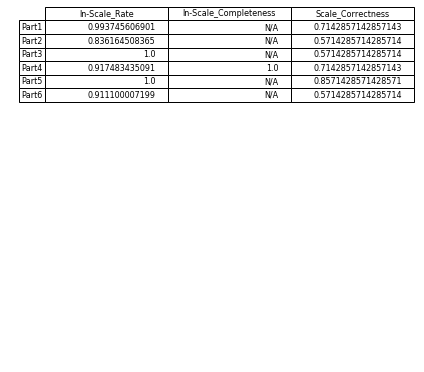

In [104]:
def plot_tableGRADES(GRADES):
    
    parts = []; inscalerates = []; inscalecompleteness = [] ; scalecorrectness = [];

    fig, ax = plt.subplots()

    ax.axis('off')
    ax.axis('tight')

    for i in range(1,len(GRADES)):
        parts.append(GRADES[i][0])
        inscalerates.append(GRADES[i][1][0])
        inscalecompleteness.append(GRADES[i][1][1])
        scalecorrectness.append(GRADES[i][1][2])

    ax.table(cellText=np.transpose([inscalerates,inscalecompleteness,scalecorrectness]),
                          rowLabels= parts,
                          colLabels= ['In-Scale_Rate', 'In-Scale_Completeness', 'Scale_Correctness'], loc='top')
    fig.tight_layout()
    plt.show()

In [95]:
inscalerates

[0.99374560690109925,
 0.83616450836460032,
 1.0,
 0.91748343509052166,
 0.99999999999999989,
 0.91110000719941153]